In [1]:
import anndata as ad
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from scipy.stats import pearsonr
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list

from bin import load_bgi as ld
from sklearn.linear_model import ElasticNet
import seaborn as sns

In [2]:
fdata = ad.read_h5ad("./RNA/Multitime.clustered.h5")

In [3]:
fdata

AnnData object with n_obs × n_vars = 66509 × 16001
    obs: 'time_point', 'n_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'cluster_cellcharter_autok', 'cluster_cellcharter_givenk', 'cluster_cellcharter'
    var: 'mt', 'mt-', 'gm', 'Rb', 'rik'
    uns: '_cellcharter', '_scvi_manager_uuid', '_scvi_uuid', 'cluster_cellcharter_autok_colors', 'cluster_cellcharter_givenk_colors', 'dendrogram_cluster_cellcharter', 'dendrogram_cluster_cellcharter_givenk', 'log1p', 'rank_genes_groups', 'spatial_neighbors'
    obsm: 'X_cellcharter', 'X_pca', 'X_scVI', 'spatial'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [2]:
d10_1_data = ld.load_bin(gem_file="gRNA/B922/cut.combined.D03658A1.merged.sgRNA.gem", bin_size=100, library_id="gRNA")
d4_1_data = ld.load_bin(gem_file="gRNA/B924/cut.combined.D03658A3.merged.sgRNA.gem", bin_size=100, library_id="gRNA")
d7_1_data = ld.load_bin(gem_file="gRNA/B926/cut.combined.D03658A6.merged.sgRNA.gem", bin_size=100, library_id="gRNA")

In [5]:
d10_1_data.write_h5ad?

Signature:
d10_1_data.write_h5ad(
    filename: 'PathLike | None' = None,
    compression: "Literal['gzip', 'lzf'] | None" = None,
    compression_opts: 'int | Any' = None,
    as_dense: 'Sequence[str]' = (),
)
Docstring:
Write `.h5ad`-formatted hdf5 file.

.. note::
   Setting compression to `'gzip'` can save disk space
   but will slow down writing and subsequent reading.
   Prior to v0.6.16, this was the default for parameter `compression`.

Generally, if you have sparse data that are stored as a dense matrix,
you can dramatically improve performance and reduce disk space
by converting to a :class:`~scipy.sparse.csr_matrix`::

    from scipy.sparse import csr_matrix
    adata.X = csr_matrix(adata.X)

Parameters
----------
filename
    Filename of data file. Defaults to backing file.
compression
    For [`lzf`, `gzip`], see the h5py :ref:`dataset_compression`.

    Alternative compression filters such as `zstd` can be passed
    from the :doc:`hdf5plugin <hdf5plugin:usage>` library.


In [6]:
d10_1_data.write_h5ad("gRNA/B922/D03658A1.tissue.guide.h5")
d4_1_data.write_h5ad("gRNA/B924/D03658A3.tissue.guide.h5")
d7_1_data.write_h5ad("gRNA/B926/D03658A6.tissue.guide.h5")

In [ ]:
d10_2_data = ld.load_bin(gem_file="gRNA/B922/C03628E2.merged.gem", bin_size=100, library_id="gRNA")
d4_2_data = ld.load_bin(gem_file="gRNA/B924/C03628A1.merged.gem", bin_size=100, library_id="gRNA")
d7_2_data = ld.load_bin(gem_file="gRNA/B926/D03658A5.merged.gem", bin_size=100, library_id="gRNA")

In [15]:
gdata = ad.concat([gdata_1, gdata_2, gdata_3])
gdata.obs_names_make_unique()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [16]:
non_sg_genes = [gene for gene in gdata.var_names if gene.startswith('sg')]
sgdata = gdata[:, non_sg_genes].copy()

In [17]:
sgdata

AnnData object with n_obs × n_vars = 66577 × 66
    obsm: 'spatial'

In [18]:
sgs = sgdata.var_names.str.split('_', n=1).str[0]
sgs_grouped = pd.DataFrame(sgdata.X.toarray(), columns=sgdata.var_names)
sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()

cgdata = ad.AnnData(sgs_grouped, obs=sgdata.obs, var=pd.DataFrame(index=sgs_grouped.columns))
cgdata.obsm['spatial'] = sgdata.obsm['spatial']
cgdata

AnnData object with n_obs × n_vars = 66577 × 33
    obsm: 'spatial'

In [3]:
sgs = gdata_1.var_names.str.split('_', n=1).str[0]
sgs_grouped = pd.DataFrame(gdata_1.X.toarray(), columns=gdata_1.var_names)
sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()

sgdata_1 = ad.AnnData(sgs_grouped, obs=gdata_1.obs, var=pd.DataFrame(index=sgs_grouped.columns))
sgdata_1.obsm['spatial'] = gdata_1.obsm['spatial']
sgdata_1

AnnData object with n_obs × n_vars = 9815 × 34
    obsm: 'spatial'

In [4]:
sgs = gdata_2.var_names.str.split('_', n=1).str[0]
sgs_grouped = pd.DataFrame(gdata_2.X.toarray(), columns=gdata_2.var_names)
sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()

sgdata_2 = ad.AnnData(sgs_grouped, obs=gdata_2.obs, var=pd.DataFrame(index=sgs_grouped.columns))
sgdata_2.obsm['spatial'] = gdata_2.obsm['spatial']
sgdata_2

AnnData object with n_obs × n_vars = 21883 × 34
    obsm: 'spatial'

In [5]:
sgs = gdata_3.var_names.str.split('_', n=1).str[0]
sgs_grouped = pd.DataFrame(gdata_3.X.toarray(), columns=gdata_3.var_names)
sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()

sgdata_3 = ad.AnnData(sgs_grouped, obs=gdata_3.obs, var=pd.DataFrame(index=sgs_grouped.columns))
sgdata_3.obsm['spatial'] = gdata_3.obsm['spatial']
sgdata_3

AnnData object with n_obs × n_vars = 22432 × 34
    obsm: 'spatial'

In [6]:
sgdata_1.obs["time_point"] = "1"
sgdata_2.obs["time_point"] = "2"
sgdata_3.obs["time_point"] = "3"
sgdata = ad.concat([sgdata_1, sgdata_2, sgdata_3])
sgdata.obs_names_make_unique()
sgdata

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 54130 × 34
    obs: 'time_point'
    obsm: 'spatial'

In [7]:
gdata = ad.read_h5ad("./gRNA/Multitime.grna.h5")

In [21]:
gdata

AnnData object with n_obs × n_vars = 66509 × 66
    obs: 'time_point'
    obsm: 'spatial', 'spatial_cov'

In [10]:
sgdata.obsm["spatial_cov"] = np.array([tuple([batch + "_" + str(array[0]), batch + "_" + str(array[1])]) for batch, array in zip(sgdata.obs["time_point"], sgdata.obsm['spatial'])])
gdata.obsm["spatial_cov"] = np.array([tuple([batch + "_" + str(array[0]), batch + "_" + str(array[1])]) for batch, array in zip(gdata.obs["time_point"], gdata.obsm['spatial'])])

In [12]:
g_cells = [tuple(array) for array in sgdata.obsm["spatial_cov"]]
t_cells = [tuple(array) for array in gdata.obsm['spatial_cov']]
cells_to_keep = [True if cell in t_cells else False for cell in g_cells]
cells_to_add = np.array([cell for cell in t_cells if cell not in g_cells])

cgdata = sgdata[cells_to_keep, :].copy()

In [13]:
cgdata

AnnData object with n_obs × n_vars = 35111 × 34
    obs: 'time_point'
    obsm: 'spatial', 'spatial_cov'

In [14]:
s = len(cells_to_add)
new_data = np.zeros((s, sgdata.n_vars))
new_obs = pd.DataFrame(index=[f'new_{i}' for i in range(s)])
new_adata = ad.AnnData(new_data, var=cgdata.var.copy(), obs=new_obs)
new_adata.obsm['spatial'] = np.array([[array[0].split('_')[1], array[1].split('_')[1]] for array in cells_to_add])
new_adata.obs['time_point'] = np.array([array[0].split('_')[0] for array in cells_to_add])

cdata = cgdata.concatenate(new_adata, join='outer', index_unique=None)

In [15]:
cdata

AnnData object with n_obs × n_vars = 66509 × 34
    obs: 'time_point', 'batch'
    obsm: 'spatial', 'spatial_cov'

In [16]:
cdata.write_h5ad("./gRNA/Multitime.grna.ntc.h5")

In [4]:
cdata = ad.read_h5ad("./gRNA/Multitime.grna.ntc.h5")

In [5]:
cdata

AnnData object with n_obs × n_vars = 66509 × 34
    obs: 'time_point', 'batch'
    obsm: 'spatial', 'spatial_cov'

In [4]:
fdata = ad.read_h5ad("./RNA/Multitime.clustered.go.h5")

In [5]:
fdata

AnnData object with n_obs × n_vars = 66509 × 17806
    obs: 'time_point', 'n_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'cluster_cellcharter', 'cluster_cellcharter_autok', 'cluster_cellcharter_givenk', 'adipogenesis_score', 'allograft_rejection_score', 'androgen_response_score', 'angiogenesis_score', 'apical_junction_score', 'apical_surface_score', 'apoptosis_score', 'cholesterol_homeostasis_score', 'coagulation_score', 'complement_score', 'epithelial_mesenchymal_transition_score', 'estrogen_response_early_score', 'estrogen_response_late_score', 'fatty_acid_metabolism_score', 'glycolysis_score', 'heme_metabolism_score', 'hypoxia_score', 'il2_stat5_signaling_score', 'il6_jak_stat3_signaling_score', 'inflammatory_response_score', 'interferon_alpha_response_score', 'interferon_gamma_response_score', 'kras_signaling_dn_score', 'kras_signaling_up_score', 'myogenesis_score', 'oxidative_phosphorylation_score', 'p53_pathway_score', 'pancreas_beta_cells_score', 'protein_secretion_score'

In [348]:
pval_cutoff = 0.01
top_n = 20

result = fdata.uns['rank_genes_groups']
groups = result['names'].dtype.names  # 获取所有聚类的名字

# 创建一个空的DataFrame用来存储结果
top_genes_df = pd.DataFrame()

for group in groups:
    # 提取每个聚类的基因名称、Log2FC、padj
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    
    # 将它们转换为DataFrame
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj
    })
    
    # 筛选出padj > 0.01的基因
    filtered_data = data[data['padj'] < 0.01]
    
    # 按Log2FoldChange降序排序
    sorted_data = filtered_data.sort_values(by='Log2FoldChange', ascending=False)
    
    # 选取排序前10的基因
    top_genes = sorted_data.head(top_n)
    
    # 添加聚类信息
    top_genes['Cluster'] = group
    
    # 将当前聚类的结果追加到总的DataFrame中
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
#top_genes_df.to_csv("./DEG.txt", index=None, sep="\t")

/tmp/ipykernel_61771/4032227071.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_genes['Cluster'] = group
/tmp/ipykernel_61771/4032227071.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_genes['Cluster'] = group
/tmp/ipykernel_61771/4032227071.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

In [7]:
deg_matrix = fdata[:, deg].X.toarray()
deg_matrix.shape

(66509, 1085)

In [8]:
new_adata.obsm['spatial'] = np.array([[array[0].split('_')[1], array[1].split('_')[1]] for array in cells_to_add])
new_adata.obs['time_point'] = np.array([array[0].split('_')[0] for array in cells_to_add])

NameError: name 'cells_to_add' is not defined

In [122]:
cdata.obs["spatial_cov"] = np.array([batch + "_" + f"{array[0]}" + "," + batch + "_" + f"{array[1]}" for batch, array in zip(cdata.obs["time_point"], cdata.obsm['spatial'])])

In [123]:
fdata.obs["spatial_cov"] = np.array([batch + "_" + f"{array[0]}" + "," + batch + "_" + f"{array[1]}" for batch, array in zip(fdata.obs["time_point"], fdata.obsm['spatial'])])

In [445]:
sorted_indices = sorted(enumerate(cdata.obs["spatial_cov"]), key=lambda x: x[1])
indexes = [orig_idx for orig_idx, _ in sorted_indices]
sorted_cdata = cdata[indexes, :].copy()
sorted_indices = sorted(enumerate(fdata.obs["spatial_cov"]), key=lambda x: x[1])
indexes = [orig_idx for orig_idx, _ in sorted_indices]
sorted_fdata = fdata[indexes, :].copy()

In [446]:
sorted_fdata.obs["spatial_cov"]

1001_1            1_0,1_1000
1101_1            1_0,1_1100
11101_1          1_0,1_11100
11201_1          1_0,1_11200
11301_1          1_0,1_11300
                   ...      
171289401_3    3_9900,3_9500
171289501_3    3_9900,3_9600
171289601_3    3_9900,3_9700
171289701_3    3_9900,3_9800
171289801_3    3_9900,3_9900
Name: spatial_cov, Length: 66509, dtype: object

In [ ]:
guide_vector = np.zeros(len(guide_expression))
guide_expression = cdata.X
ntc_expression = cdata[:, "sgnon-targeting"].X.flatten()

guide_name = "sgGata3"
guide_index = np.where(cdata.var_names == guide_name)[0][0]
for i in range(len(guide_expression)):
    flags = False
    for idx, str in enumerate(cdata.var_names):
        if str != guide_name:
            flags = flags or (guide_expression[i, idx] > 0)
    if guide_expression[i, guide_index] > 0 and flags == 0:
        guide_vector[i] = guide_expression[i, guide_index]
    else:
        guide_vector[i] = 0
guide_vector = guide_vector.reshape(-1, 1)

In [341]:
guide_expression = cdata.X
ntc_expression = cdata[:, "sgnon-targeting"].X.flatten()

corr_matrix = np.zeros((len(cdata.var_names[:-1]), len(deg)))

for guide_name in tqdm(cdata.var_names[:-1]):

    guide_index = np.where(cdata.var_names == guide_name)[0][0]
    guide_vector = np.zeros(len(guide_expression))
    for i in range(len(guide_expression)):
        flags = False
        for idx, str in enumerate(cdata.var_names):
            if str != guide_name:
                flags = flags or (guide_expression[i, idx] > 0)
        if guide_expression[i, guide_index] > 0 and flags == 0:
            guide_vector[i] = guide_expression[i, guide_index]
        else:
            guide_vector[i] = 0
    guide_vector = guide_vector.reshape(-1, 1)
    corr_vector = np.zeros(len(deg))

    regr = ElasticNet(random_state=0, alpha=0.05, l1_ratio=0.05)
    regr.fit(y=guide_vector, X=deg_matrix)

    corr_vector = regr.coef_.flatten()
    corr_matrix[guide_index, :] = corr_vector

  0%|          | 0/33 [00:00<?, ?it/s]

100%|██████████| 33/33 [01:18<00:00,  2.37s/it]


In [ ]:
genes = cdata.var_names
corr_matrix = np.zeros((len(deg), len(genes)))
for i_gene, gene in tqdm(enumerate(genes)):
    
    guide_vec = guide_matrix[i_gene].reshape(-1, 1)
    regr = ElasticNet(random_state=0, alpha=0.01, l1_ratio=0.01)

    regr.fit(guide_vec, deg_matrix)
    corr_matrix[:, i_gene] = regr.coef_.flatten()

0it [00:00, ?it/s]

34it [01:25,  2.50s/it]


<Axes: >

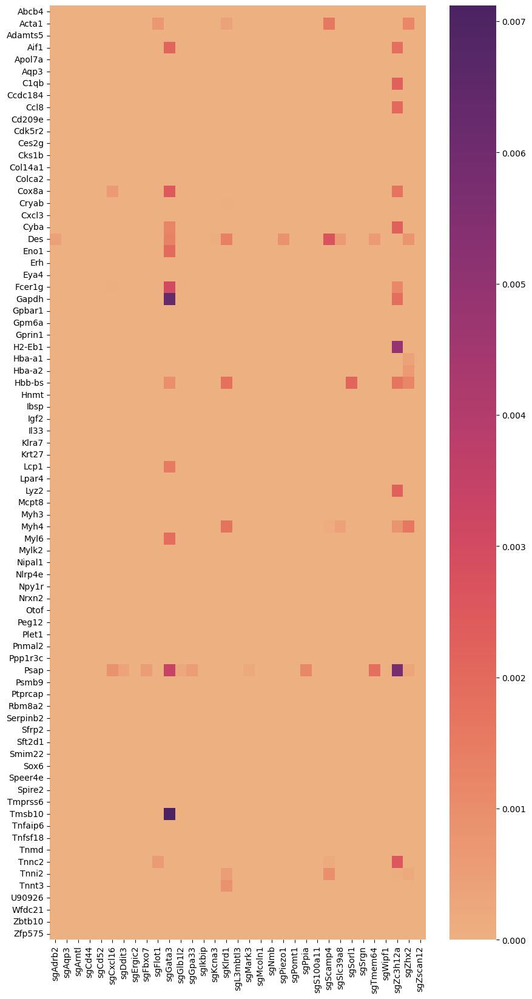

In [342]:
fig, ax = plt.subplots(figsize=(10, 20))
corr_df = pd.DataFrame(corr_matrix, index=cdata.var_names[:-1], columns=deg)

interests = []
for ig, g in enumerate(cdata.var_names[:-1]):
    t = corr_df.iloc[ig, :].sort_values(ascending=False)
    interests += [gene for gene in t.index[:10]]
    t = corr_df.iloc[ig, :].sort_values(ascending=True)
    interests += [gene for gene in t.index[-10:]]

interests = np.unique(interests)
corr_df = corr_df.loc[:, interests]

# distance_matrix_gRNA = 1 - corr_df.T.corr()
# Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
# gRNA_order = leaves_list(Z_gRNA)
# distance_matrix_gRNA = 1 - corr_df.corr()
# Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
# RNA_order = leaves_list(Z_gRNA)

# #corr_df = corr_df.iloc[gRNA_order, RNA_order]
# corr_df = corr_df.iloc[RNA_order, :]
# #sns.heatmap(corr_df, cmap="flare", yticklabels=cgdata.var_names[:-1], xticklabels=clusters, ax=ax)
sns.heatmap(corr_df.T, cmap="flare", xticklabels=corr_df.index, yticklabels=corr_df.columns, ax=ax)

In [ ]:
guide_with_signal = ["sgCxcl16", "sgFlot1", "sgGata3", "sgKlrd1", "sgPiezo1", "sgScamp4", "sgSlc39a8", "sgSorl1", "sgTmem64", "sgZc3h12a", "sgZhx2"]
guide_without_signal = [str for str in cdata.var_names if str not in guide_with_signal]

In [349]:
mask = [True if str in deg else False for str in sorted_fdata.var_names]
l2fc_matrix = np.zeros((13, len(deg)))
for i, vec in enumerate(sorted_fdata.uns["rank_genes_groups"]["logfoldchanges"][mask]):
    l2fc_matrix[:, i] = [item for item in vec]
l2fc_matrix

array([[ 0.67046785,  0.5008074 ,  0.4515112 , ..., -0.39126611,
        -0.73213416, -0.84154809],
       [ 0.44132227,  0.81017137,  0.80011082, ..., -0.77463537,
        -0.07257959, -0.3068409 ],
       [ 0.16399682,  0.14236517,  1.0602262 , ..., -0.51827747,
        -1.26505625, -0.64146233],
       ...,
       [ 3.39674616,  3.46718121,  1.19673002, ..., -0.74751878,
        -0.85145414, -0.87910181],
       [ 0.82111663,  1.04326069,  1.27608776, ..., -1.10129523,
        -1.44902968, -0.40505797],
       [ 3.94421935,  0.99731588,  0.59548879, ..., -1.15266669,
        -0.94381171, -1.0414834 ]])

In [350]:
guide_matrix = np.zeros((13, 34))
cluster_matrix = [sorted_cdata[sorted_fdata.obs["cluster_cellcharter"] == f"{i}"].X.toarray() for i in range(13)]
for i in range(13):
    guide_sum_vec = [np.sum(vec) for vec in cluster_matrix[i].T]
    guide_matrix[i, :] = np.log(guide_sum_vec)

In [351]:
genes = cdata.var_names
corr_matrix = np.zeros((len(deg), len(genes)))

regr = ElasticNet(random_state=0, alpha=0.01, l1_ratio=0.01)
regr.fit(l2fc_matrix, guide_matrix);
corr_matrix = regr.coef_

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.991e-03, tolerance: 7.084e-04
  model = cd_fast.enet_coordinate_descent(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.935e-03, tolerance: 1.272e-03
  model = cd_fast.enet_coordinate_descent(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

In [352]:
np.sum(corr_matrix)

12.67127313019516

In [212]:
print(np.where(sorted_cdata.var_names == "sgPomt1")[0][0])
print(guide_matrix[:, 10])
print(guide_matrix[:, 33])
print([len(np.where(sorted_fdata.obs["cluster_cellcharter"] == f"{i}")[0]) for i in range(13)])

21
[ 4618.  3885.  3024.  1995.  4323. 10005.  2599.   753.  9447.  5015.
  4197.  2829.  2651.]
[2037. 1532. 1799.  748. 2090. 4596. 1131.  244. 3725. 1848. 2657. 1313.
 1297.]
[5005, 4341, 10416, 3006, 4160, 11808, 2578, 4680, 7138, 3559, 5174, 2364, 2280]


In [278]:
interests = [gene for i, gene in enumerate(deg) if (corr_matrix[:, 21] > 0.025)[i]]

In [284]:
top_genes_df.iloc[[i for i, idx in enumerate(top_genes_df.loc[:, "Gene"]) if idx in interests], :].groupby("Cluster").count()["Gene"]

Cluster
10    16
11    23
12    21
6      4
7      5
8     11
9      5
Name: Gene, dtype: int64

In [254]:
np.sum(corr_matrix[:, 10])

0.055086314518502794

In [271]:
np.multiply(np.sign(corr_df.T), np.log(np.abs(corr_df.T)))

,sgnon-targeting,sgL3mbtl3,sgPpia,sgKcna3,sgPomt1,sgMcoln1,sgZscan12,sgCxcl16,sgPiezo1,sgCd52,...,sgNmb,sgZhx2,sgGata3,sgS100a11,sgSrgn,sgTmem64,sgSlc39a8,sgIkbip,sgArntl,sgMark3
Shisa2,-5.047906,-3.570774,-5.141633,6.256440,2.889127,5.854988,-7.588466,-5.412723,-3.808379,-4.913958,...,7.373478,6.266832,6.076500,4.369509,5.076700,5.038691,4.086099,4.557964,4.437374,5.268616
Grem1,-5.022837,-3.544723,-5.252348,6.297138,2.914136,5.717645,-7.546003,-5.294941,-3.686855,-4.914828,...,6.217373,6.258442,6.032723,4.298458,4.946624,4.937250,4.012424,4.441499,4.519399,5.184517
Trem2,-5.028342,-3.548116,-5.132286,6.302006,2.891020,6.249769,-6.693096,-5.316791,-3.702390,-4.869097,...,5.852921,6.116959,5.947932,4.264021,4.814392,4.890059,4.015641,4.467507,4.444266,5.211891
Fbln2,-5.559076,-4.080958,-7.783295,6.345235,2.708564,4.078469,4.692151,-4.358491,-3.159290,-5.351898,...,7.190013,5.392127,6.893307,3.685938,4.960788,4.321728,5.016292,-6.178439,4.433291,-7.657605
Lgr5,-5.449769,-4.232303,-6.116772,6.208285,2.940370,4.940363,5.170504,-4.304459,-3.165054,-5.334331,...,4.529006,5.921301,6.456215,3.635188,4.443524,4.528476,5.636761,7.104432,4.780074,-6.109970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Postn,-5.749358,-4.251646,-5.335299,-5.942431,5.421322,-5.106999,-4.606162,6.271357,-4.122006,-4.349343,...,4.660706,5.007498,5.226088,4.187175,4.019032,4.269484,-8.104571,5.082730,4.097992,5.386955
AC123870.1,-4.797743,-3.719940,-7.507424,6.777541,3.975715,5.687541,-8.729551,-5.405152,-3.358035,-6.409741,...,5.073270,-5.507311,6.249603,4.926694,-6.590480,5.689507,3.768462,3.910085,5.899017,5.559409
Tmem132e,-4.860195,-3.768429,-8.622784,6.215021,3.854185,5.881236,-8.257875,-5.199266,-3.388702,-7.095942,...,4.897026,-5.496922,6.343993,5.095859,-7.008441,5.717056,3.811635,4.005296,6.956121,5.697831
Mypn,-5.022435,-3.773615,-4.845271,6.923980,3.300377,-4.447945,-5.880292,-4.904571,-3.937767,-6.462264,...,3.853564,5.268506,6.126026,3.392423,5.212860,4.586137,5.907909,4.991432,4.532683,4.570837


'12'

['AC134453.1' 'Abca12' 'Cd5l' 'Filip1l' 'Fmod' 'Fut9' 'Hspb7' 'Kcnip1'
 'Kpna1' 'Lrguk' 'Mpeg1' 'Mybpc1' 'Mylpf' 'Tmtc2' 'Tnni2']


/tmp/ipykernel_61771/3879368899.py:16: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
/tmp/ipykernel_61771/3879368899.py:19: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_RNA = linkage(distance_matrix_gRNA, method='ward')


<Axes: >

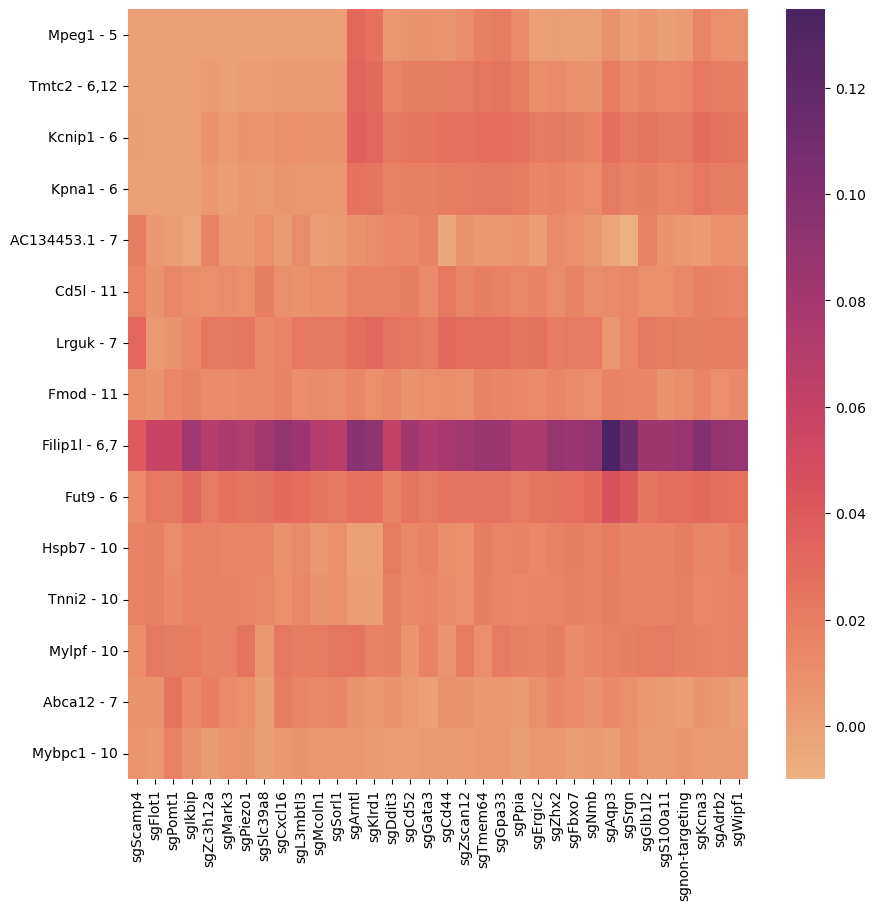

In [367]:
fig, ax = plt.subplots(figsize=(10, 10))
corr_df = pd.DataFrame(corr_matrix, index=cdata.var_names, columns=deg)

interests = []
for ig, g in enumerate(cdata.var_names[:-1]):
    t = corr_df.iloc[ig, :].sort_values(ascending=False)
    interests += [gene for gene in t.index[:5]]
    t = corr_df.iloc[ig, :].sort_values(ascending=True)
    interests += [gene for gene in t.index[-5:]]

interests = np.unique(interests)
print(interests)
corr_df = corr_df.loc[:, interests]

distance_matrix_gRNA = 1 - corr_df.T.corr()
Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
gRNA_order = leaves_list(Z_gRNA)
distance_matrix_gRNA = 1 - corr_df.corr()
Z_RNA = linkage(distance_matrix_gRNA, method='ward')
RNA_order = leaves_list(Z_RNA)

corr_df = corr_df.iloc[gRNA_order, RNA_order]
#corr_df = corr_df.iloc[gRNA_order,:]

# #sns.heatmap(corr_df, cmap="flare", yticklabels=cgdata.var_names[:-1], xticklabels=clusters, ax=ax)
#log_corr_df = np.multiply(np.sign(corr_df.T), np.log(np.abs(corr_df.T)))
gene_clusters = [",".join(top_genes_df[top_genes_df["Gene"] == gene]["Cluster"].tolist()) for gene in corr_df.columns]
sns.heatmap(corr_df.T, cmap="flare", xticklabels=corr_df.index, yticklabels=[gene + " - " + cluster for gene, cluster in zip(corr_df.columns, gene_clusters)], ax=ax)

In [60]:
for guide_name in cdata.var_names[:-1]:

    guide_index = np.where(cdata.var_names == guide_name)[0][0]
    guide_vector = np.zeros(len(guide_expression))
    cnt = 0
    for i in range(len(guide_expression)):
        flags = False
        for idx, str in enumerate(cdata.var_names):
            if str != guide_name:
                flags = flags or (guide_expression[i, idx] > 0)
        if guide_expression[i, guide_index] > 0 and flags == 0:
            guide_vector[i] = guide_expression[i, guide_index]
            cnt += 1
        else:
            guide_vector[i] = 0
    print(guide_name, cnt)

sgAdrb2 284
sgAqp3 96
sgArntl 152
sgCd44 79
sgCd52 228
sgCxcl16 328
sgDdit3 266
sgErgic2 188
sgFbxo7 216
sgFlot1 269
sgGata3 1457
sgGlb1l2 237
sgGpa33 234
sgIkbip 122
sgKcna3 143
sgKlrd1 258
sgL3mbtl3 87
sgMark3 185
sgMcoln1 145
sgNmb 87
sgPiezo1 156
sgPomt1 19
sgPpia 400
sgS100a11 187
sgScamp4 359
sgSlc39a8 139
sgSorl1 325
sgSrgn 73
sgTmem64 385
sgWipf1 252
sgZc3h12a 1477
sgZhx2 435
sgZscan12 228


In [391]:
tdata.obs["guide"][30:1000]

38222601_1     0
52783401_1     0
60063801_1     0
63704001_1     0
72804501_1     0
              ..
116362601_2    0
12538201_2     0
82352601_2     0
19700401_2     0
125316301_2    0
Name: guide, Length: 970, dtype: category
Categories (1, int64): [0]

In [414]:
guide_expression.shape

(66509, 34)

In [431]:
tdata.uns["rank_genes_groups"]

{'params': {'groupby': 'guide',
  'reference': 'rest',
  'method': 't-test',
  'use_raw': False,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('Filip1l', 'Spp1'), ('Camk1d', 'Ly6c1'), ('Ankrd1', 'Plat'),
            ..., ('Plat', 'Ankrd1'), ('Ly6c1', 'Camk1d'),
            ('Spp1', 'Filip1l')],
           dtype=[('0', 'O'), ('1', 'O')]),
 'scores': rec.array([( 7.4834347,  5.7408304), ( 7.4415145,  5.21115  ),
            ( 7.115239 ,  4.7852354), ..., (-4.7852354, -7.115239 ),
            (-5.21115  , -7.4415145), (-5.7408304, -7.4834347)],
           dtype=[('0', '<f4'), ('1', '<f4')]),
 'pvals': rec.array([(2.37422949e-13, 1.55186380e-08),
            (3.44567124e-13, 2.54225545e-07),
            (2.57003362e-12, 2.23093432e-06), ...,
            (2.23093432e-06, 2.57003362e-12),
            (2.54225545e-07, 3.44567124e-13),
            (1.55186380e-08, 2.37422949e-13)],
           dtype=[('0', '<f8'), ('1', '<f8')]),
 'pvals_adj': rec.array([(2.7567

In [435]:
guide_name = "sgnon-targeting"
guide_index = np.where(cdata.var_names == guide_name)[0][0]
ntc_only_bins = []
for i in range(len(guide_expression)):
    flags = False
    for idx, gene in enumerate(cdata.var_names):
        if gene != guide_name:
            flags = flags or (guide_expression[i, idx] > 0)
    if guide_expression[i, guide_index] > 0 and flags == 0:
        ntc_only_bins.append(i)

for guide_name in guide_without_signal:
    combined_bins = ntc_only_bins.copy()
    guide_index = np.where(cdata.var_names == guide_name)[0][0]
    for i in range(len(guide_expression)):
        flags = False
        for idx, gene in enumerate(cdata.var_names):
            if gene != guide_name:
                flags = flags or (guide_expression[i, idx] > 0)
        if guide_expression[i, guide_index] > 0 and flags == False:
            combined_bins.append(i)
    
    fdata.obs["guide"] = 1
    fdata.obs["guide"][ntc_only_bins] = 0
    tdata = fdata[combined_bins, :].copy()
    tdata.obs["guide"] = tdata.obs["guide"].astype("category")
    sc.tl.rank_genes_groups(tdata, groupby="guide", method="t-test")
    result = sc.get.rank_genes_groups_df(tdata, group=["0", "1"])
    top10_deg = result.head(10)
    print(guide_name, top10_deg)

/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgAdrb2   group     names    scores  logfoldchanges         pvals     pvals_adj
0     0   Filip1l  7.483435        0.767208  2.374229e-13  2.756709e-09
1     0    Camk1d  7.441514        0.717662  3.445671e-13  2.756709e-09
2     0    Ankrd1  7.115239        1.408050  2.570034e-12  1.370770e-08
3     0  AY036118  7.069448        0.581379  4.862049e-12  1.555953e-08
4     0      Nrap  7.037450        1.417984  4.351583e-12  1.555953e-08
5     0    Il31ra  6.980493        0.648562  7.712677e-12  2.056842e-08
6     0      Gphn  6.896433        0.747174  1.352614e-11  3.091882e-08
7     0    Jarid2  6.643572        0.859473  6.151178e-11  1.230313e-07
8     0      Cdk8  6.509853        0.653651  1.467512e-10  2.609072e-07
9     0    Malat1  6.492779        0.664169  1.900450e-10  2.820884e-07


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgAqp3   group   names    scores  logfoldchanges         pvals     pvals_adj
0     0    Myh2  9.881906        2.000120  5.841823e-21  9.347500e-17
1     0   Hspb7  9.437082        2.455897  2.864204e-19  2.291507e-15
2     0    Fhl1  8.958450        1.874323  3.490534e-17  1.117041e-13
3     0   Xirp2  8.884941        2.010831  2.922426e-17  1.117041e-13
4     0  Ankrd2  8.860262        2.188781  2.784402e-17  1.117041e-13
5     0  Mybpc1  8.190441        1.971508  6.327617e-15  1.687470e-11
6     0   Acta1  7.961192        0.909643  2.396344e-14  5.477700e-11
7     0    Car3  7.903161        1.606057  5.288361e-14  1.057738e-10
8     0   Alpk3  7.604439        4.075690  1.179092e-13  2.096295e-10
9     0    Myh1  7.532497        1.289734  4.729078e-13  7.566998e-10


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgArntl   group    names    scores  logfoldchanges         pvals     pvals_adj
0     0     Car3  9.773569        1.970098  8.868217e-21  4.730011e-17
1     0    Xirp2  9.759050        2.200106  7.265152e-21  4.730011e-17
2     0      Des  8.833805        1.157743  1.548798e-17  4.956465e-14
3     0    Hspb7  8.671318        2.079468  4.621026e-17  1.232351e-13
4     0   Ankrd2  8.553453        1.915103  1.057261e-16  2.114655e-13
5     0    Acta1  8.508006        0.969447  2.068985e-16  3.678426e-13
6     0     Myl1  8.350479        1.444292  1.142125e-15  1.827515e-12
7     0     Nrap  8.101260        1.980540  4.148418e-15  6.034440e-12
8     0    Mylpf  7.950547        1.122062  1.479442e-14  1.797374e-11
9     0  Synpo2l  7.943420        2.567986  9.001904e-15  1.200329e-11


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgCd44   group     names    scores  logfoldchanges         pvals     pvals_adj
0     0      Cd44  8.091396        0.802750  1.658239e-13  2.653348e-09
1     0    Camk1d  6.896101        0.812803  1.767665e-10  1.058877e-06
2     0      Gphn  6.853974        0.957415  2.647027e-10  1.058877e-06
3     0      Cdk8  6.777883        0.810839  2.121106e-10  1.058877e-06
4     0    Il31ra  6.769608        0.863684  4.793417e-10  1.533989e-06
5     0   Filip1l  5.656390        0.662554  6.716453e-08  1.535285e-04
6     0  Adamts10  5.606965        2.660500  4.240339e-08  1.130828e-04
7     0     Kpna1  5.286523        0.883993  4.129780e-07  8.260076e-04
8     0      Hexb  5.264971        0.738942  5.803927e-07  9.286863e-04
9     0     Tmtc2  5.103024        1.176823  7.355059e-07  1.069894e-03


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgCd52   group    names    scores  logfoldchanges         pvals     pvals_adj
0     0    Hspb7  9.501543        2.059423  3.215998e-20  5.145918e-16
1     0    Kpna1  8.958284        1.196876  3.622387e-18  2.898091e-14
2     0   Camk1d  8.905149        0.815696  8.013823e-18  3.205730e-14
3     0     Myh2  8.852715        1.627368  6.761341e-18  3.205730e-14
4     0   Ankrd2  8.577943        1.719547  6.173613e-17  1.975680e-13
5     0  Filip1l  8.532187        0.907792  1.602003e-16  3.775887e-13
6     0   Il31ra  8.513985        0.756876  1.651847e-16  3.775887e-13
7     0   Ankrd1  8.211648        1.676441  1.031824e-15  2.063777e-12
8     0    Xirp2  8.096387        1.635274  2.547299e-15  4.528814e-12
9     0   Jarid2  8.080395        1.067774  3.617607e-15  5.788532e-12


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgDdit3   group   names    scores  logfoldchanges         pvals     pvals_adj
0     0    Fhl1  9.469444        1.602164  3.618115e-20  4.982811e-16
1     0  Ankrd2  9.413209        1.999562  6.228124e-20  4.982811e-16
2     0   Csrp3  9.146093        1.682149  5.667130e-19  3.022658e-15
3     0   Hspb7  8.971363        1.993312  2.353065e-18  8.034475e-15
4     0    Myh2  8.962918        1.680536  2.510617e-18  8.034475e-15
5     0    Car3  8.857973        1.524552  5.865227e-18  1.564158e-14
6     0   Xirp2  8.790426        1.703252  1.020354e-17  2.332383e-14
7     0   Casq2  8.560555        3.283896  8.879743e-17  1.578720e-13
8     0  Ankrd1  8.313349        1.742297  4.376065e-16  6.805293e-13
9     0     Des  8.304949        1.022328  4.678346e-16  6.805293e-13


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgErgic2   group   names    scores  logfoldchanges         pvals     pvals_adj
0     0  Ankrd1  8.685359        1.928060  3.156710e-17  5.051051e-13
1     0  Il31ra  7.638802        0.730759  1.560933e-13  1.248825e-09
2     0  Camk1d  7.367954        0.723672  9.539732e-13  5.088175e-09
3     0   Myom3  6.905170        2.695873  1.182562e-11  4.730545e-08
4     0    Gphn  6.489058        0.757807  2.719284e-10  6.215895e-07
5     0   Tmtc2  6.480237        1.384981  1.979802e-10  6.182808e-07
6     0    Cd44  6.480033        0.533765  2.318408e-10  6.182808e-07
7     0  Jarid2  6.267475        0.838760  8.037285e-10  1.428940e-06
8     0  Ankrd2  6.262365        1.388302  7.524299e-10  1.428940e-06
9     0    Cdk8  6.001960        0.616943  3.876259e-09  5.638548e-06


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgFbxo7   group   names     scores  logfoldchanges         pvals     pvals_adj
0     0    Myh2  10.310517        1.997505  2.683302e-23  2.670131e-19
1     0  Ankrd2   9.508362        2.157350  3.057143e-20  1.222934e-16
2     0    Fhl1   9.222204        1.698576  3.821515e-19  1.222961e-15
3     0    Myh1   8.920708        1.409511  4.194812e-18  9.588742e-15
4     0   Xirp2   8.858943        1.822554  6.910476e-18  1.382181e-14
5     0  Klhl41   8.734052        2.000925  1.936085e-17  3.442143e-14
6     0  Ankrd1   8.668397        1.982248  3.282481e-17  5.252298e-14
7     0    Cilp   8.624487        2.054939  4.311242e-17  6.271289e-14
8     0    Car3   8.499507        1.536085  1.248905e-16  1.665310e-13
9     0  Mybpc1   8.460988        1.758596  1.623088e-16  1.997771e-13


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgGlb1l2   group   names     scores  logfoldchanges         pvals     pvals_adj
0     0   Xirp2  11.940926        2.438833  6.140258e-30  9.825027e-26
1     0   Hspb7  11.220243        2.548071  7.595664e-27  4.051274e-23
2     0   Acta1  11.214667        1.079841  6.117399e-27  4.051274e-23
3     0    Myh2  11.130051        2.050023  1.463160e-26  5.853006e-23
4     0    Fhl1  10.716506        1.837102  5.944068e-25  1.902221e-21
5     0  Ankrd2  10.639030        2.270514  1.613378e-24  4.302610e-21
6     0    Nrap  10.543389        2.410149  3.187521e-24  7.286217e-21
7     0   Mylpf  10.345217        1.269743  1.772279e-23  3.150915e-20
8     0   Csrp3  10.312422        1.875537  2.772901e-23  4.436919e-20
9     0  Mybpc1  10.197456        2.146258  6.856411e-23  9.973584e-20


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgGpa33   group   names    scores  logfoldchanges         pvals     pvals_adj
0     0   Casq2  8.674142        3.359002  3.845983e-17  2.051319e-13
1     0   Xirp2  8.666275        1.716845  2.974206e-17  2.051319e-13
2     0    Myh1  8.543403        1.328242  7.911539e-17  3.164813e-13
3     0     Ttn  8.326218        1.397353  4.500430e-16  1.200190e-12
4     0    Myh2  8.186852        1.551516  1.238872e-15  2.831884e-12
5     0   Casq1  8.125896        1.666799  1.948753e-15  3.464666e-12
6     0  Pdlim3  8.050364        1.577711  3.473834e-15  5.514981e-12
7     0    Myl1  8.049591        1.194727  3.791313e-15  5.514981e-12
8     0    Nrap  8.010735        1.694044  4.651959e-15  6.202999e-12
9     0   Tnnc2  7.517418        0.876830  1.738830e-13  1.738938e-10


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgIkbip   group    names    scores  logfoldchanges         pvals     pvals_adj
0     0   Ankrd2  9.356453        2.312727  2.884971e-19  4.616241e-15
1     0    Xirp2  8.289035        2.012862  2.128989e-15  1.703298e-11
2     0   Klhl41  7.070364        1.726757  8.051780e-12  4.294551e-08
3     0    Hspb7  6.965992        1.773275  1.527408e-11  6.110013e-08
4     0    Myoz2  6.819341        2.498198  2.473143e-11  7.914552e-08
5     0   Ankrd1  6.775864        1.848871  6.524906e-11  1.491500e-07
6     0  Srrm4os  6.709243        3.161738  4.641935e-11  1.237927e-07
7     0   Mybpc1  6.436268        1.554193  4.514115e-10  9.028795e-07
8     0     Fhl1  6.415299        1.419290  5.929840e-10  9.058496e-07
9     0     Nrap  6.357956        1.583585  6.680419e-10  9.058496e-07


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgKcna3   group   names    scores  logfoldchanges         pvals     pvals_adj
0     0  Il31ra  8.493332        0.802147  7.103315e-16  1.136601e-11
1     0    Gphn  7.883341        0.980372  8.103002e-14  4.321871e-10
2     0  Camk1d  7.838974        0.764817  6.519101e-14  4.321871e-10
3     0    Cd44  7.168969        0.617375  4.666988e-12  1.493530e-08
4     0    Cdk8  6.279328        0.671489  1.010502e-09  2.309862e-06
5     0  Kcnip1  5.889551        1.554279  8.949808e-09  1.508541e-05
6     0   Crhr2  5.843155       25.809959  9.427789e-09  1.508541e-05
7     0   Otud1  5.613978        2.437966  3.106811e-08  4.142674e-05
8     0    Hexb  5.584307        0.687660  5.802973e-08  7.142568e-05
9     0   Kpna1  5.277485        0.865529  2.598525e-07  2.969929e-04


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgL3mbtl3   group    names    scores  logfoldchanges         pvals  pvals_adj
0     0    Tmtc2  6.157642        1.462039  2.896001e-09   0.000019
1     0    Stau2  6.044321        3.790411  2.811811e-09   0.000019
2     0     Hus1  6.011112       25.683395  3.635217e-09   0.000019
3     0    Kpna1  5.926331        1.106840  1.965484e-08   0.000079
4     0   Fkbp14  5.556373        3.581736  4.461238e-08   0.000143
5     0   March3  5.500067        3.967618  5.743036e-08   0.000153
6     0   Cthrc1  5.392363        3.038685  1.090698e-07   0.000248
7     0    Itpkc  5.368043       25.608715  1.238353e-07   0.000248
8     0    Epha3  5.311562       25.430605  1.661839e-07   0.000295
9     0  Tmem86b  5.270588       25.173073  2.053792e-07   0.000329


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgMark3   group   names     scores  logfoldchanges         pvals     pvals_adj
0     0  Ankrd1  10.550223        2.454161  3.626633e-24  5.802975e-20
1     0    Fhl1   9.414701        1.838944  1.131668e-19  3.017971e-16
2     0   Hspb7   9.112081        2.151390  1.001794e-18  2.289957e-15
3     0   Kpna1   8.773411        1.253849  2.779674e-17  4.941952e-14
4     0  Ankrd2   8.754543        1.928581  1.743773e-17  3.487764e-14
5     0     Des   8.195364        1.123156  1.791329e-15  2.204850e-12
6     0  Mybpc1   7.884820        1.779273  1.662188e-14  1.662292e-11
7     0    Car3   7.562263        1.433691  1.669045e-13  1.483688e-10
8     0  Atp1a2   7.499067        1.766635  2.260889e-13  1.904026e-10
9     0   Cryab   7.484602        1.297854  2.728186e-13  2.182685e-10


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgMcoln1   group   names     scores  logfoldchanges         pvals     pvals_adj
0     0  Ankrd1  10.373916        2.518677  2.880653e-23  4.609332e-19
1     0    Fhl1   9.968612        1.999643  1.991370e-21  1.424807e-17
2     0   Hspb7   9.872418        2.584983  2.671345e-21  1.424807e-17
3     0   Cryab   8.961057        1.605996  7.031853e-18  2.812917e-14
4     0  Mybpc1   8.842755        1.960982  1.393700e-17  4.460119e-14
5     0  Ankrd2   8.713626        2.047026  3.527334e-17  9.406812e-14
6     0   Tnnt3   8.708974        1.251561  8.914506e-17  1.783013e-13
7     0    Myh2   8.676305        1.889197  6.588975e-17  1.506146e-13
8     0   Acta1   8.630657        1.016527  1.054568e-16  1.874904e-13
9     0    Nrap   8.331624        2.064553  8.010915e-16  1.281826e-12


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgNmb   group   names    scores  logfoldchanges         pvals     pvals_adj
0     0   Hspb7  8.663003        2.477006  3.146416e-16  5.034580e-12
1     0   Ampd1  7.458085        4.487392  3.302811e-13  2.642414e-09
2     0    Trdn  7.358366        2.446448  1.319717e-12  7.038933e-09
3     0   Actn2  7.261674        1.632777  6.414361e-12  2.052724e-08
4     0   Xirp2  7.192293        2.017908  1.255315e-11  3.347716e-08
5     0   Abcc9  7.081729       26.014715  5.054946e-12  2.022105e-08
6     0  Ankrd2  7.043373        1.975475  2.146317e-11  4.292902e-08
7     0    Myh2  7.037356        1.623374  1.933767e-11  4.292902e-08
8     0  Pdlim3  6.628798        1.686039  2.627566e-10  4.204369e-07
9     0     Des  6.592856        1.125552  4.424674e-10  5.199474e-07


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgPomt1   group   names     scores  logfoldchanges         pvals     pvals_adj
0     0  Col5a2  12.450170        4.816229  5.541696e-25  4.732501e-21
1     0    Ccr5  11.325253        3.820191  1.083097e-16  8.252680e-14
2     0    Sod3  10.918341       27.521696  5.915257e-25  4.732501e-21
3     0   Smyd1  10.820886       27.372232  1.395306e-24  7.442098e-21
4     0   Lmcd1  10.420868       27.810747  4.501558e-23  1.800736e-19
5     0   Rbm28  10.070648       27.319120  8.818103e-22  2.383730e-18
6     0   Fndc1  10.069036       27.229273  8.938429e-22  2.383730e-18
7     0    Cd27  10.031295       27.132038  1.226922e-21  2.804568e-18
8     0   Kcnk2   9.831532       26.915974  6.477264e-21  1.295534e-17
9     0   Snta1   9.710122       27.287466  1.761787e-20  3.132261e-17


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgPpia   group   names     scores  logfoldchanges         pvals     pvals_adj
0     0    Fhl1  10.649852        1.692362  1.084914e-24  1.735970e-20
1     0  Ankrd2  10.411767        2.129577  1.253071e-23  7.448926e-20
2     0   Hspb7  10.389089        2.210255  1.396586e-23  7.448926e-20
3     0  Mybpc1   9.987042        1.932860  4.027082e-22  1.610933e-18
4     0   Csrp3   9.941154        1.739392  6.915563e-22  2.213118e-18
5     0    Myh2   9.722409        1.685682  4.603542e-21  1.227688e-17
6     0   Xirp2   9.175786        1.680396  4.188894e-19  9.575214e-16
7     0    Nrap   8.886313        1.779592  4.486426e-18  8.973413e-15
8     0   Cryab   8.708124        1.281927  1.918782e-17  3.411382e-14
9     0  Ankrd1   8.672983        1.710580  2.379931e-17  3.808127e-14


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgS100a11   group   names    scores  logfoldchanges         pvals     pvals_adj
0     0    Gphn  9.470521        1.019022  1.905732e-19  3.049362e-15
1     0  Jarid2  8.960040        1.099012  4.312177e-18  3.449957e-14
2     0  Camk1d  8.736528        0.795580  4.354368e-17  2.322475e-13
3     0  Il31ra  8.558241        0.747555  1.588535e-16  5.083630e-13
4     0    Cd44  8.410933        0.618945  3.248410e-16  8.662967e-13
5     0   Myom3  7.657263        3.285619  7.284759e-14  1.665192e-10
6     0    Cdk8  7.617256        0.699412  1.066985e-13  2.134103e-10
7     0    Nrap  7.557640        1.707002  1.551507e-13  2.758407e-10
8     0   Tmtc2  7.321347        1.528792  7.666484e-13  1.024642e-09
9     0    Myh2  7.305614        1.374554  8.324693e-13  1.024642e-09


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgSrgn   group     names    scores  logfoldchanges         pvals     pvals_adj
0     0     Smyd1  7.163022        3.207371  6.108824e-12  9.774730e-08
1     0   Macrod2  6.505140       25.912165  1.943105e-10  1.554581e-06
2     0     Actc1  5.822043       25.842915  1.061105e-08  5.519682e-05
3     0     Lrrc2  5.778305        3.655196  1.379834e-08  5.519682e-05
4     0     Gnl3l  5.560528        2.681577  6.084102e-08  1.622529e-04
5     0  Atp6v0e2  5.554658       25.472897  4.601030e-08  1.472422e-04
6     0      Nnmt  5.449769        2.881442  9.926850e-08  2.269136e-04
7     0     Them4  5.367318       24.962275  1.243064e-07  2.486283e-04
8     0     Epha3  5.311562       25.430605  1.661839e-07  2.954566e-04
9     0   Tmem86b  5.270588       25.173073  2.053792e-07  3.286273e-04


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgWipf1   group   names     scores  logfoldchanges         pvals     pvals_adj
0     0   Hspb7  10.354741        2.415618  1.654459e-23  1.529054e-19
1     0    Myh2  10.347683        1.873665  1.911198e-23  1.529054e-19
2     0   Xirp2  10.040079        1.977103  2.734974e-22  1.458744e-18
3     0  Ankrd1   9.876043        2.122436  1.156186e-21  4.625033e-18
4     0    Myh1   9.611397        1.666511  1.247038e-20  3.990770e-17
5     0    Cilp   9.560100        2.343676  1.875237e-20  5.000943e-17
6     0   Acta1   9.286666        1.066169  2.048916e-19  4.683530e-16
7     0   Cryab   9.114635        1.455837  7.418143e-19  1.483721e-15
8     0  Ankrd2   9.081839        1.948464  9.894965e-19  1.759215e-15
9     0    Nrap   9.034305        1.998480  1.441754e-18  2.306951e-15


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0


sgZscan12   group    names    scores  logfoldchanges         pvals  pvals_adj
0     0    Hspb7  6.157334        1.349082  1.292610e-09   0.000021
1     0   Ankrd2  5.950182        1.265114  4.362521e-09   0.000034
2     0   Ankrd1  5.889654        1.243885  6.282602e-09   0.000034
3     0    Kpna1  5.767592        0.829399  1.371217e-08   0.000055
4     0  Srrm4os  5.647856        2.128839  2.351520e-08   0.000075
5     0    Xirp2  5.620040        1.111388  2.849325e-08   0.000076
6     0     Gphn  5.484087        0.658648  7.077239e-08   0.000162
7     0     Cd44  5.304819        0.498339  1.767726e-07   0.000334
8     0   Il31ra  5.299158        0.561939  1.877821e-07   0.000334
9     0    Myom3  5.159175        1.754643  3.227230e-07   0.000469


/tmp/ipykernel_61771/2186891153.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fdata.obs["guide"][ntc_only_bins] = 0
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


ZeroDivisionError: division by zero

In [ ]:
combined_bins

In [64]:
fdata_1 = fdata[fdata.obs["time_point"] == "1", deg]
sc.pp.normalize_total(fdata_1)

fdata_2 = fdata[fdata.obs["time_point"] == "2", deg]
sc.pp.normalize_total(fdata_2)

fdata_3 = fdata[fdata.obs["time_point"] == "3", deg]
sc.pp.normalize_total(fdata_3)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:233: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:233: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/wpy/miniconda3/envs/scanpy/lib/

In [447]:
sorted_fdata.write_h5ad("./RNA/Multitime_sorted.h5")
sorted_cdata.write_h5ad("./RNA/Multitime_sorted.guide.h5")

In [442]:
sorted_cdata[sorted_cdata.obs["time_point"] == "3"].X

ArrayView([[0., 0., 0., ..., 0., 0., 0.],
           [0., 0., 0., ..., 0., 0., 0.],
           [0., 0., 0., ..., 0., 0., 0.],
           ...,
           [0., 0., 0., ..., 0., 0., 0.],
           [0., 5., 0., ..., 0., 0., 1.],
           [0., 0., 0., ..., 0., 0., 0.]])

In [35]:
deg_matrix_1 = fdata[fdata.obs["time_point"] == "1", deg].X.toarray()
deg_matrix_2 = fdata[fdata.obs["time_point"] == "2", deg].X.toarray()
deg_matrix_3 = fdata[fdata.obs["time_point"] == "3", deg].X.toarray()

guide_expression = cdata[cdata.obs["time_point"] == "1", :].X
ntc_expression = cdata[cdata.obs["time_point"] == "1", "sgnon-targeting"].X.flatten()
guide_matrix_1 = np.zeros([len(guide_expression.T), len(guide_expression)])
for i in range(len(guide_expression.T)):
    guide_matrix_1[i] = np.log2(guide_expression.T[i] + 1e-9) - np.log2(ntc_expression + 1e-9)

guide_expression = cdata[cdata.obs["time_point"] == "2", :].X
ntc_expression = cdata[cdata.obs["time_point"] == "2", "sgnon-targeting"].X.flatten()
guide_matrix_2 = np.zeros([len(guide_expression.T), len(guide_expression)])
for i in range(len(guide_expression.T)):
    guide_matrix_2[i] = np.log2(guide_expression.T[i] + 1e-9) - np.log2(ntc_expression + 1e-9)

guide_expression = cdata[cdata.obs["time_point"] == "3", :].X
ntc_expression = cdata[cdata.obs["time_point"] == "3", "sgnon-targeting"].X.flatten()
guide_matrix_3 = np.zeros([len(guide_expression.T), len(guide_expression)])
for i in range(len(guide_expression.T)):
    guide_matrix_3[i] = np.log2(guide_expression.T[i] + 1e-9) - np.log2(ntc_expression + 1e-9)

In [87]:
genes = cdata.var_names[:-1]
corr_matrix_1 = np.zeros((len(deg), len(genes)))
for i_gene, gene in tqdm(enumerate(genes)):
    
    guide_vec = guide_matrix_1[i_gene].reshape(-1, 1)
    regr = ElasticNet(random_state=0, alpha=0.05, l1_ratio=0.05)

    regr.fit(guide_vec, deg_matrix_1)
    corr_matrix_1[:, i_gene] = regr.coef_.flatten()

33it [00:24,  1.33it/s]


In [88]:
genes = cdata.var_names[:-1]
corr_matrix_2 = np.zeros((len(deg), len(genes)))
for i_gene, gene in tqdm(enumerate(genes)):
    
    guide_vec = guide_matrix_2[i_gene].reshape(-1, 1)
    regr = ElasticNet(random_state=0, alpha=0.05, l1_ratio=0.05)

    regr.fit(guide_vec, deg_matrix_2)
    corr_matrix_2[:, i_gene] = regr.coef_.flatten()

33it [00:25,  1.29it/s]


In [89]:
genes = cdata.var_names[:-1]
corr_matrix_3 = np.zeros((len(deg), len(genes)))
for i_gene, gene in tqdm(enumerate(genes)):
    
    guide_vec = guide_matrix_3[i_gene].reshape(-1, 1)
    regr = ElasticNet(random_state=0, alpha=0.05, l1_ratio=0.05)

    regr.fit(guide_vec, deg_matrix_3)
    corr_matrix_3[:, i_gene] = regr.coef_.flatten()

33it [00:22,  1.46it/s]


In [90]:
corr_matrix = np.zeros((3, len(deg), len(genes)))
corr_matrix[0,:,:] = corr_matrix_1
corr_matrix[1,:,:] = corr_matrix_2
corr_matrix[2,:,:] = corr_matrix_3

In [125]:
Fibroblasts = ["Col1a1", "Col1a2", "Col3a1","Mmp2", "Myl9", "Dcn","Fap"]
Tex = ['Havcr2', 'Lag3', 'Pdcd1', 'Entpd1', 'Tigit', 'Ctla4', 'Layn']
Macrophages = ["Ptprc", "Cd14", "Itgam", "Itgax", "Trem2", "Fcgr3a", "Fcgr3b", "Ccr2", "Cd163", "Cd68", "Arg1", "Adgre1", "Cd33", "Cd68", "C1qa", "Cd163",  "C1qb", "C1qc",  "Marco", "Cd81"]
Inter = Macrophages
interests = np.array(deg)[np.isin(deg, Inter)]
inter_idx = np.array(range(len(deg)))[np.isin(deg, Inter)]
print(interests)

['Itgax' 'Cd163' 'C1qc' 'C1qb' 'Arg1' 'Trem2']


['Gzmc' '4930535E02Rik' 'Grp' 'Glycam1' 'Klra1' 'Cxcl10' 'Mcpt1' 'Khdc1a'
 'Ly6i' 'A2m' 'Khdc1c' 'Prf1' 'Psap' 'Klra8' 'Mcemp1' 'Gzma' 'Ncr1'
 'Il2ra' 'Klra7' 'Dnase1l3' 'Slc17a6' 'Nrgn' '4933424M12Rik' 'Klra9'
 'Mcpt8' 'Ccdc88b' 'Irf4' 'Gzme' 'Perp' 'Lpl' 'Gzmd' 'Il2rb' 'Fpr2'
 'Cxcl9' 'Klrk1' 'Itgax' 'Pld4' 'Klrb1c' 'Dapl1' 'Rgs8' 'Lcp1' 'Sdc3'
 'Serpina3g' 'Apol6' 'Icam1' 'Coro1a' 'Rgs16' 'Arxes2' 'Slamf8' 'Nup210']


In [ ]:

guide_name = cdata.var_names[g_idx]
#grna_matrix = corr_matrix[:, inter_idx, g_idx]
plt.figure(figsize=(10, 6))
time_points = ["Day 4", "Day 7", "Day 10"]

for i, gene in enumerate(deg):
    plt.plot(time_points, corr_matrix[: ,inter_idx, g_idx], marker='o', label=gene)

plt.xlabel('Time Points')
plt.ylabel('Expression Level')
plt.title(f'Fibroblast score ~ {guide_name} Over Time')
plt.grid(True)
plt.show()

In [ ]:
degs = [[] for i in range(13)]
for i in range(13):
    degs[i] = top_genes_df.loc[top_genes_df["Cluster"] == str(i)]["Gene"]

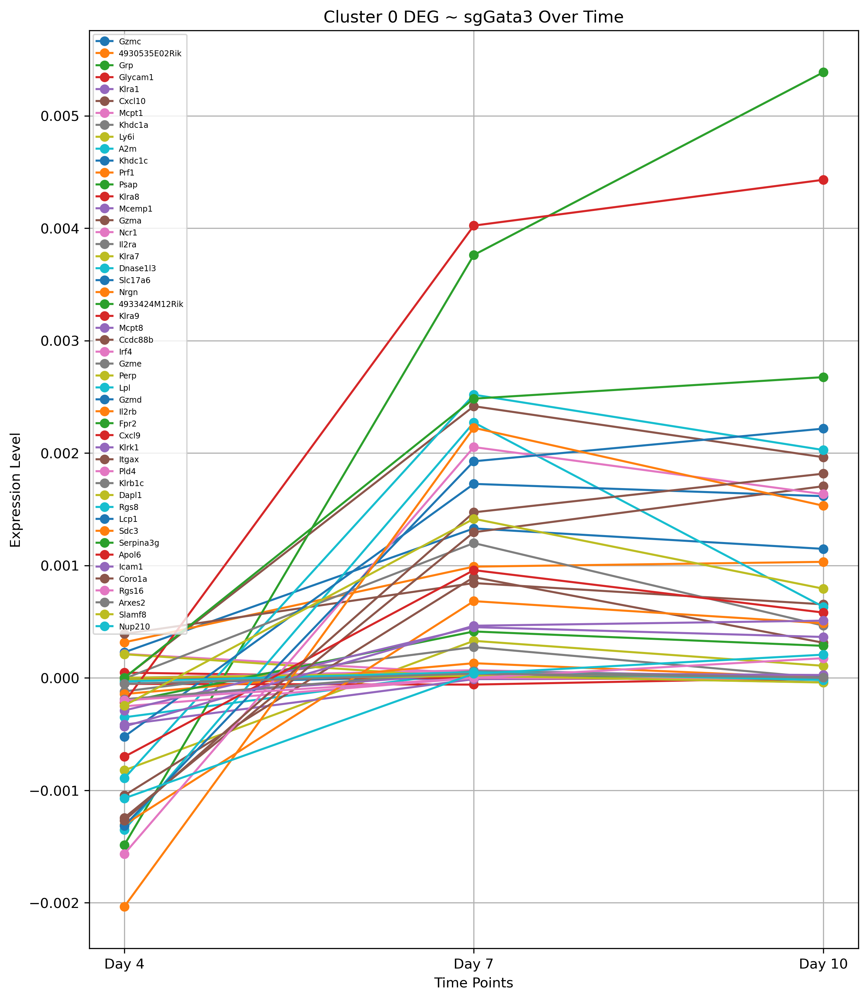

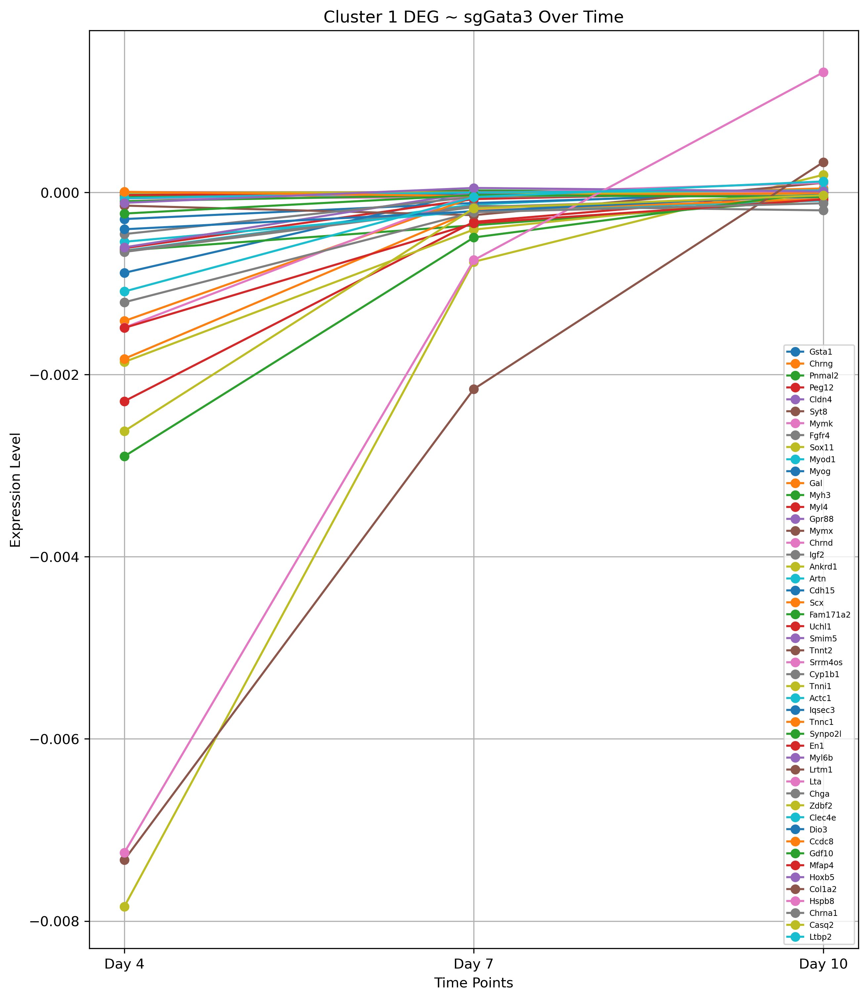

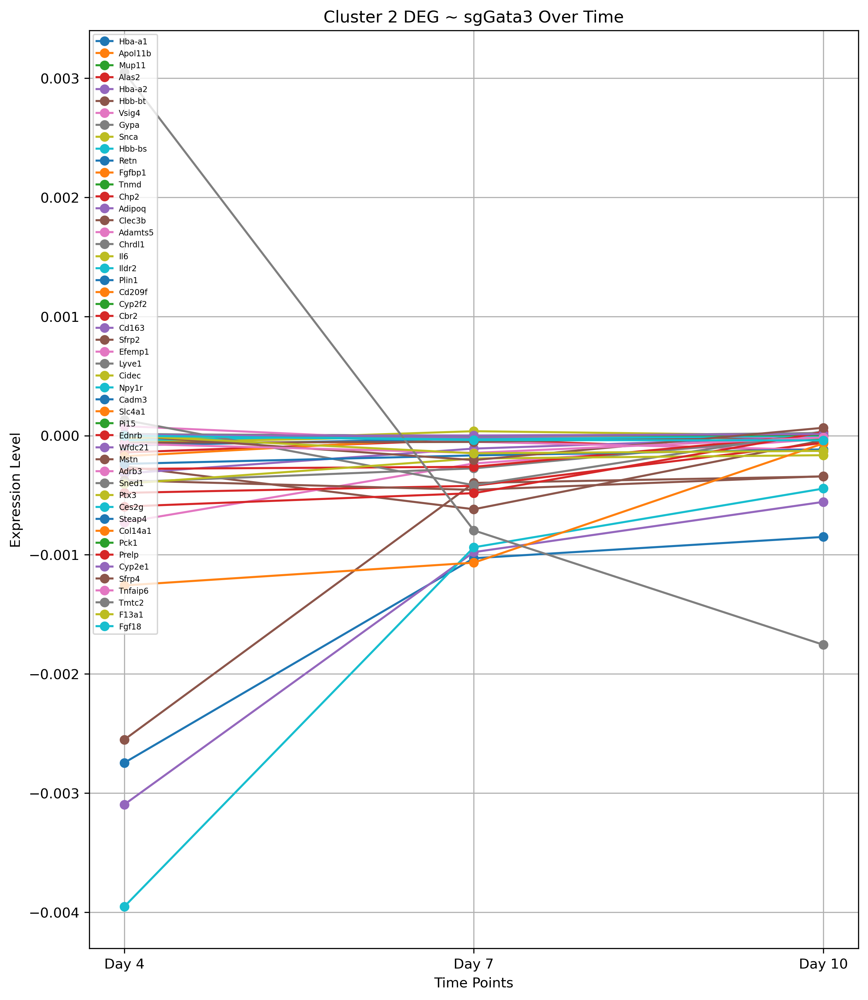

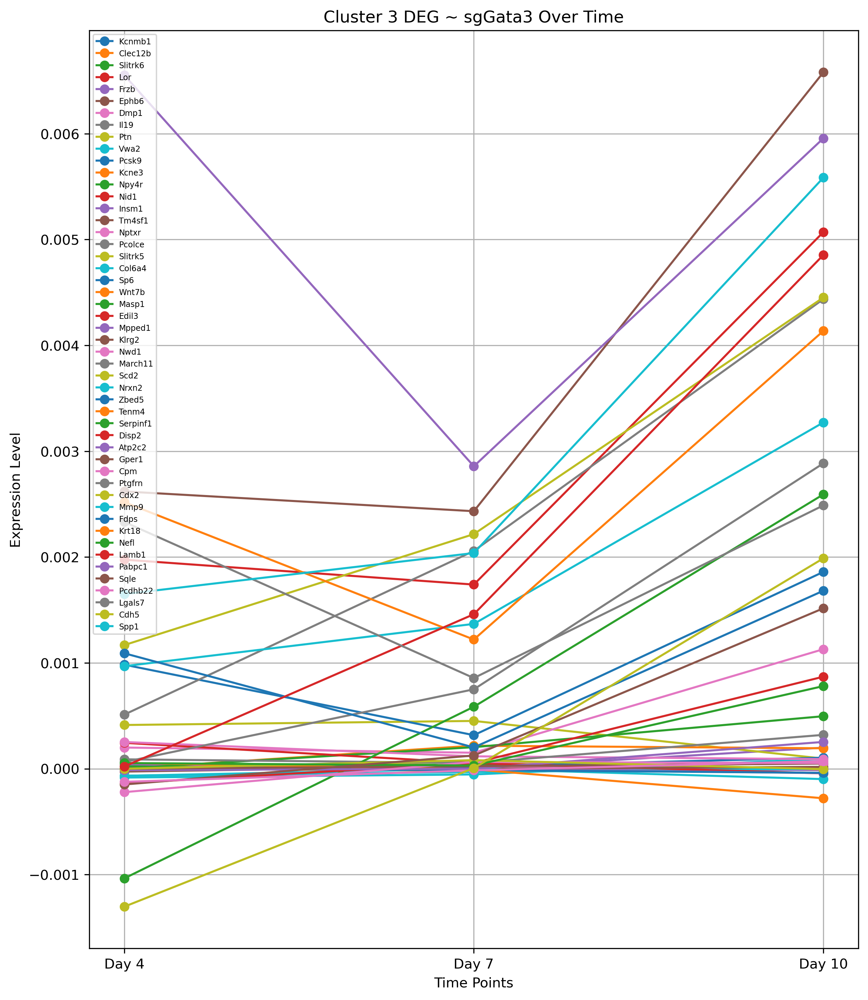

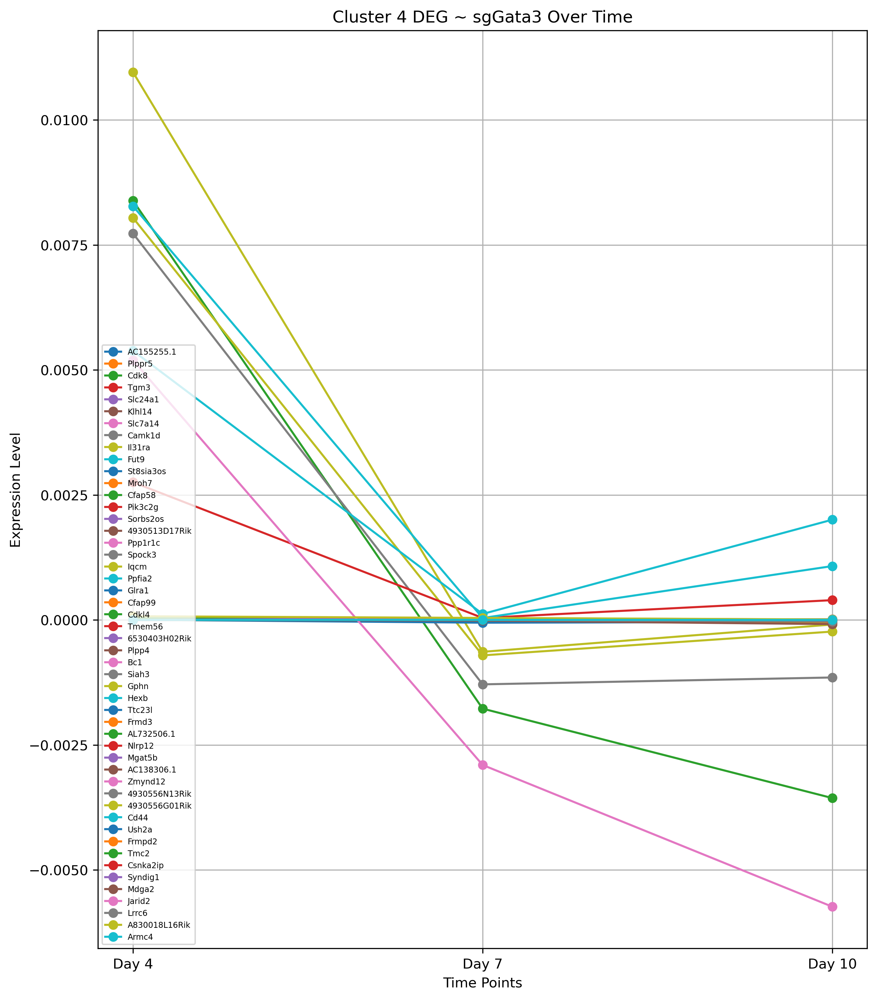

...

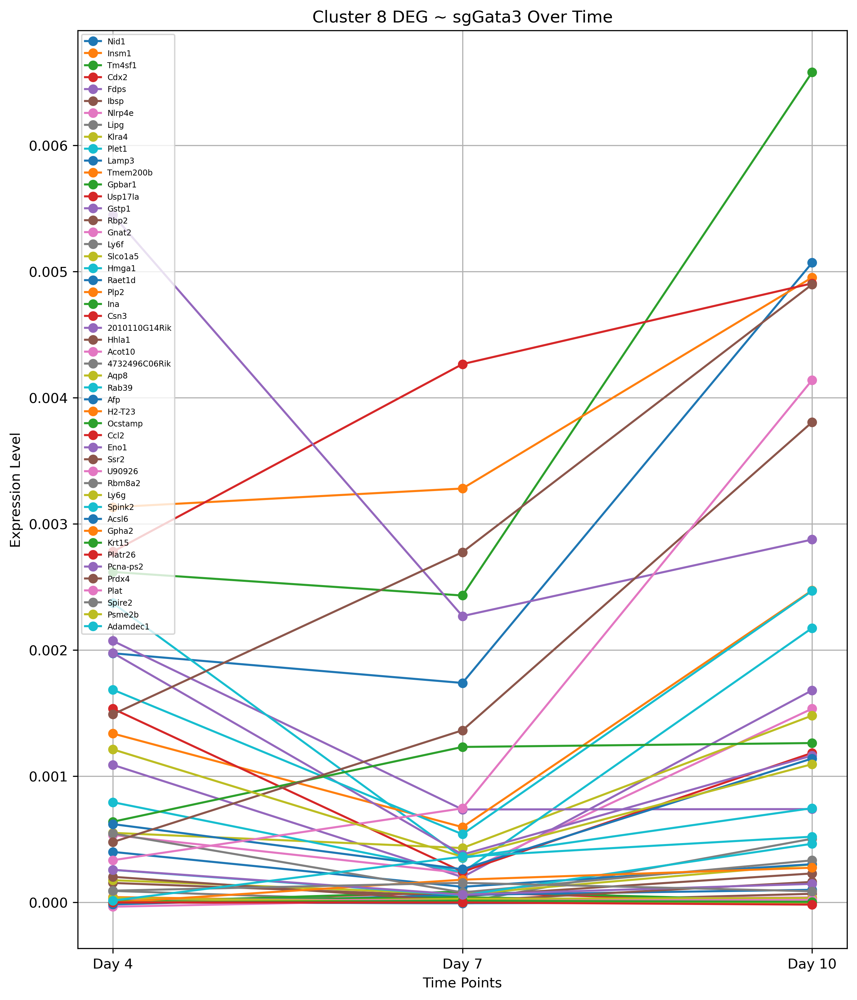

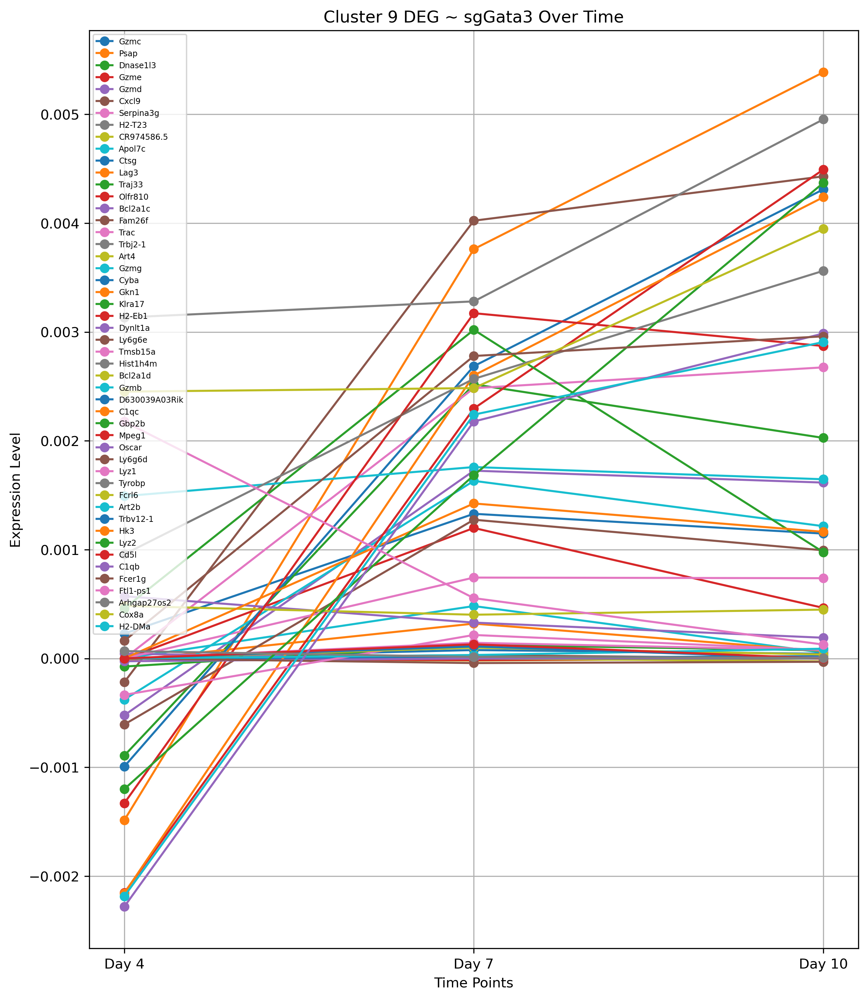

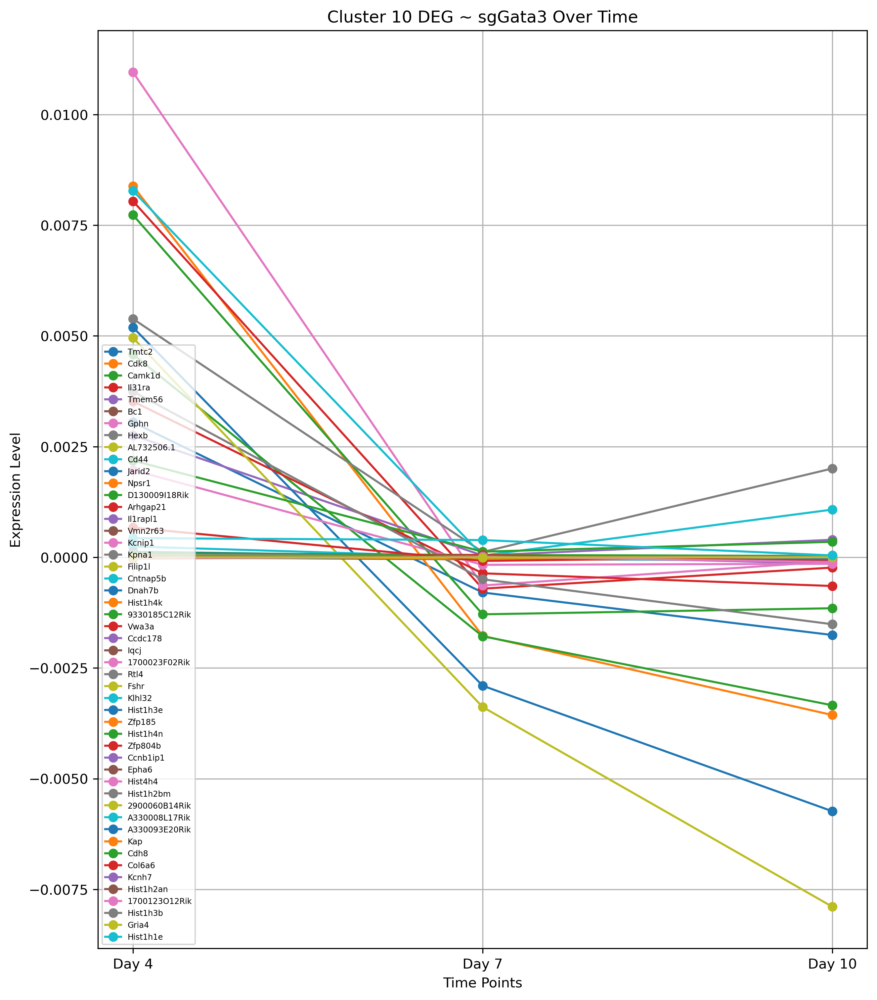

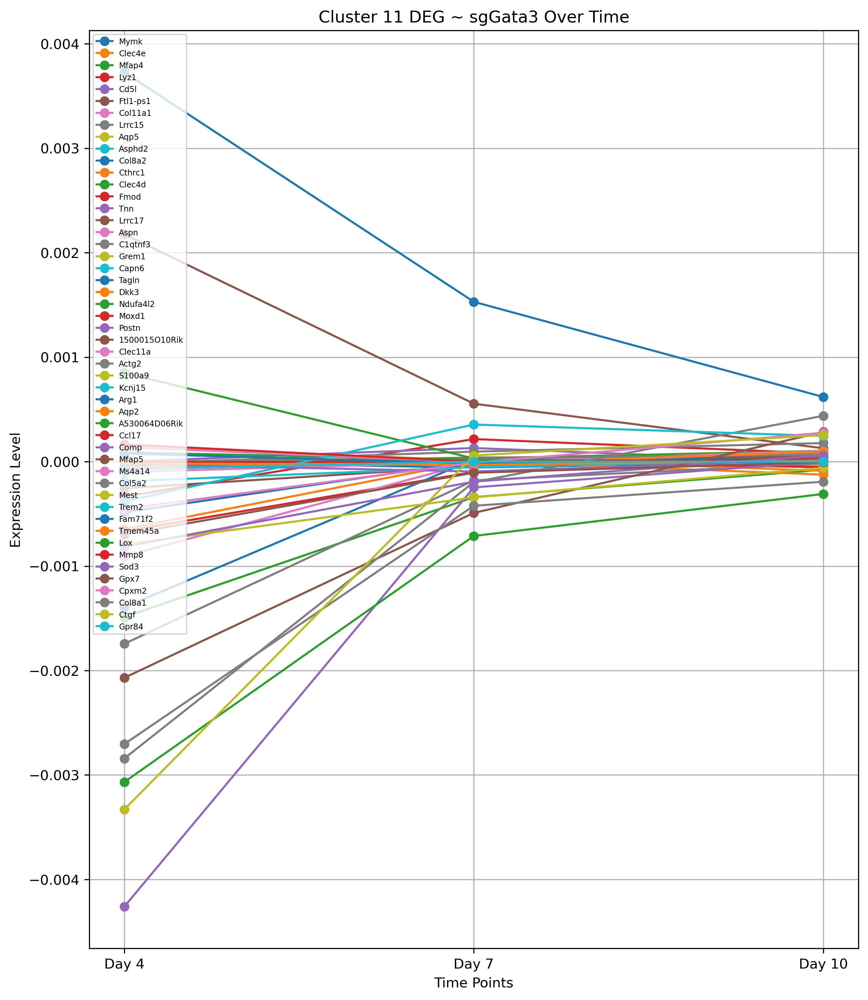

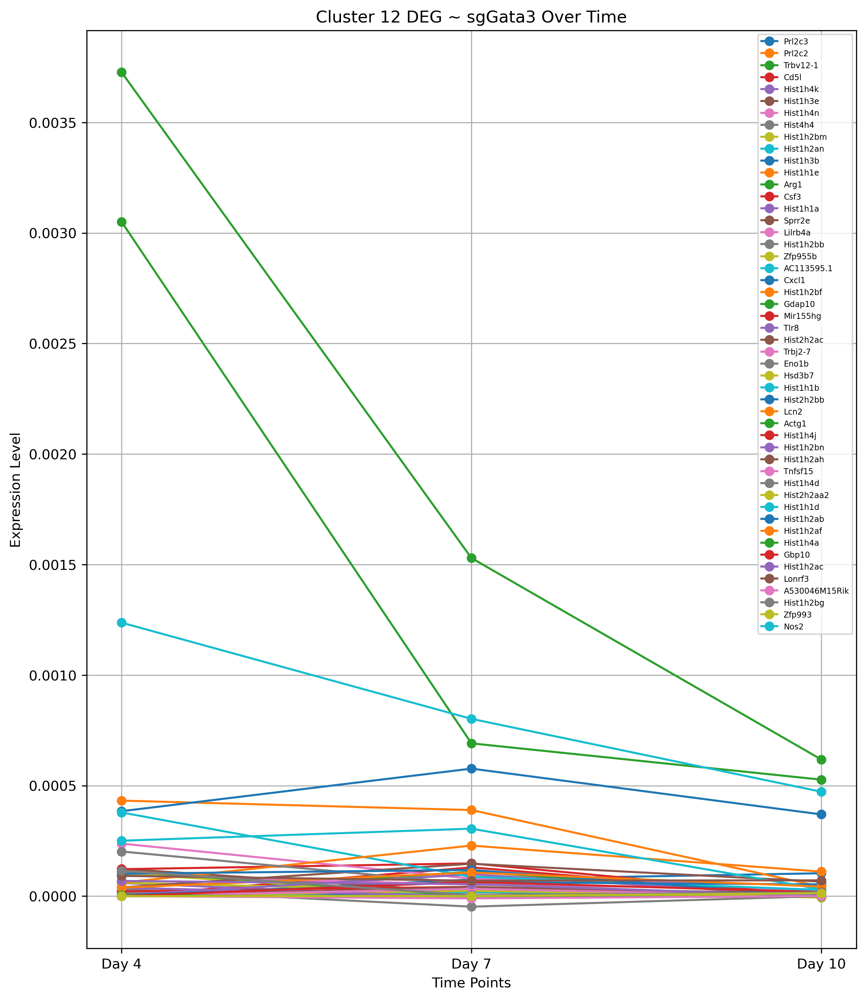

In [169]:
for i in range(13):
    Inter = degs[i]
    interests = np.array(deg)[np.isin(deg, Inter)]
    inter_idx = np.array(range(len(deg)))[np.isin(deg, Inter)]

    g_idx = np.where(cdata.var_names == "sgGata3")[0][0]
    guide_name = cdata.var_names[g_idx]
    #grna_matrix = corr_matrix[:, inter_idx, g_idx]
    plt.figure(figsize=(10, 12), dpi=300)
    time_points = ["Day 4", "Day 7", "Day 10"]

    #for i, gene in enumerate(deg):
    plt.plot(time_points, corr_matrix[: ,inter_idx, g_idx], marker='o', label=interests)

    plt.xlabel('Time Points')
    plt.ylabel('Expression Level')
    plt.title(f'Cluster {i} DEG ~ {guide_name} Over Time')
    plt.grid(True)
    plt.legend(loc="best", fontsize="xx-small")
    plt.show()